In [58]:
# conda packages: numpy, networkx, matplotlib

In [1]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import csv
import pandas as pd
import random
import community
import scipy
from scipy.stats import spearmanr
from collections import defaultdict



In [3]:
# data load
data_small = "./data/twitter-small.tsv"
data_large = "./data/twitter-larger.tsv"

In [5]:
# parsing into terminal
with open(data_small, newline='', encoding='utf-8') as file:
    tsv_small = csv.reader(file, delimiter='\t')

    for row in tsv_small:
        timestamp, username, tweet = row
        # Process the data from each row as needed
        print(f"Timestamp: {timestamp}")
        print(f"Username: {username}")
        print(f" Tweet: {tweet}")



Timestamp: 2009-06-11 17:03:30
Username: hatespeechradio
 Tweet: #followfriday (because I like to be a day early) @gaustenbooks
Timestamp: 2009-06-11 17:13:11
Username: champagnemanoir
 Tweet: RT @Ruth_Z don't tweet blindly... check out how many of your followers are On line http://bit.ly/dlLU #twitteranalyzer #followfriday @Ruth_Z
Timestamp: 2009-06-11 17:14:01
Username: emperoranton
 Tweet: RT @Ohdoctah @micah @sarahrobinson Twitter Following PSA - http://iqmz.com/pty8ph #followfriday #tweepletuesday WE CAN DO BETTER...
Timestamp: 2009-06-11 17:15:20
Username: seattlelawgirl
 Tweet: BTW, it's not #FollowFriday but @go2girlevents has been a BIG help w/ the wedding already - from a la carte svcs 2 full-meal-deal packages.
Timestamp: 2009-06-11 17:23:56
Username: fridayluv
 Tweet: On Fridays don&#8217;t &#8216;pollute your stream&#8217; with #followfriday tweets of nothing but @replies. Give some context to everyone..
Timestamp: 2009-06-11 17:34:09
Username: susiecheng
 Tweet: #followfr

In [6]:
# Task 3.1
with open(data_small, newline='', encoding='utf-8') as file:
    tsv_small = csv.reader(file, delimiter='\t')

    adjency_list = {}
    for row in tsv_small:
        timestamp, username, tweet = row

        # split the text into words  to analyze
        words = tweet.split()

        user_mentions = {}

        for word in words:
            if word.startswith('@'):
                tag = ''.join(e for e in word if (e.isalnum() or e == '@'))

                if word != username:
                    user_mentions[tag] = user_mentions.get(tag, 0) + 1

        adjency_list[username] = user_mentions

with open('data/adjency_list.csv', 'w', newline='', encoding='utf-8') as csv_file:
    csv_writer = csv.writer(csv_file)
    csv_writer.writerow(["Source", "Target", "Weight"])
    
    for user, mentions in adjency_list.items():
        for mention, count in mentions.items():
            csv_writer.writerow([user, mention, count])

In [35]:
# Task 3.2


# grap init
G_small = nx.DiGraph()

df = pd.read_csv('data/adjency_list.csv')

for index, row in df.iterrows():
    source = row['Source']
    target = row['Target']
    weight = row['Weight']
    G_small.add_edge(source, target)
    # handle the third argument (weight)
    G_small[source][target]['weight'] = weight


# calculate number of nodes and edges

number_edges = G_small.number_of_edges()
number_nodes = G_small.number_of_nodes()

print("Number of edges: " + str(number_edges))
print("Number of nodes: " + str(number_nodes))

Number of edges: 83558
Number of nodes: 77693


In [64]:
# size and number of SCC, WCC
SCC_list = list(nx.strongly_connected_components(G_small))
number_SCC = len(SCC_list)
SCC_size_list = [len(SCC) for SCC in SCC_list]

WCC_list = list(nx.weakly_connected_components(G_small))
number_WCC = len(WCC_list)
WCC_size_list = [len(WCC) for WCC in WCC_list]


print("Strongly Connected Components (SCCs):")
print(f"Number of SCCs: {number_SCC}")
print(f"Sizes of SCCs: {SCC_size_list}")

print("\nWeakly Connected Components (WCCs):")
print(f"Number of WCCs: {number_WCC}")
print(f"Sizes of WCCs: {WCC_size_list}")

Strongly Connected Components (SCCs):
Number of SCCs: 77693
Sizes of SCCs: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [105]:
# density
density = number_edges / (number_nodes * (number_nodes - 1))
print("Density of the network: {:.8f}".format(density))

Density of the network: 0.00001384


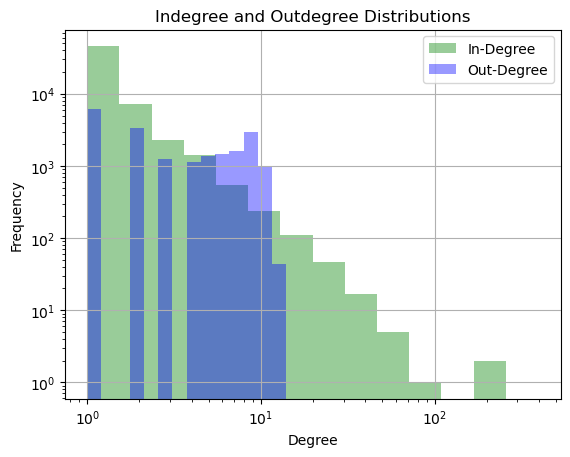

In [66]:
# indegree and outdegree
in_degree_small = dict(G_small.in_degree())
out_degree_small = dict(G_small.out_degree())

# bins=np.logspace used to create bins to solve issue of disporortional frequence and degrees.
plt.hist(list(in_degree_small.values()), bins=np.logspace(0, np.log10(max(in_degree_small.values())), 15), alpha=0.4, color='green', label='In-Degree')
plt.hist(list(out_degree_small.values()), bins=np.logspace(0, np.log10(max(out_degree_small.values())), 15), alpha=0.4, color='blue', label='Out-Degree')

# apply logarithmic scaling to the x-axis and y-axis
plt.xscale('log')  
plt.yscale('log')

plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.title('Indegree and Outdegree Distributions')
plt.grid(True)
plt.show()

In [109]:
# average clustering coefficient

average_clustering_small = nx.average_clustering(G_small)

print(f"Average Node Clustering Coefficient: {average_clustering_small:.5}")

Average Node Clustering Coefficient: 0.0


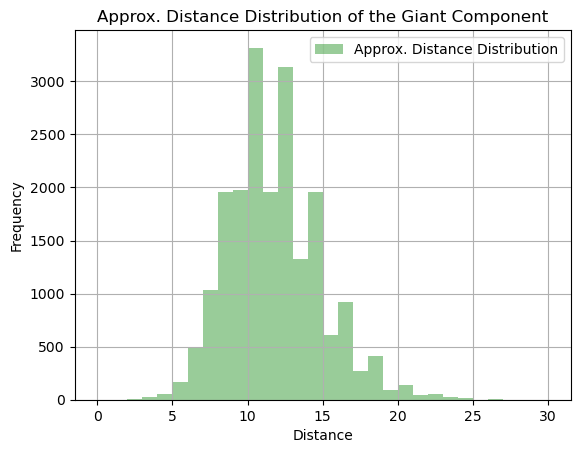

In [33]:
# (undirected) (approximated) distance distribution of the giant component
G = nx.Graph()


csv_file_path = 'data/adjency_list.csv'

with open(csv_file_path, 'r', newline='', encoding='utf-8') as file:
    csv_reader = csv.reader(file)
    next(csv_reader)  # skip the header

    for row in csv_reader:
        source, target, weight = row
        G.add_edge(source, target, weight=int(weight))

# find giang component
giant_component = max(nx.connected_components(G), key=len)
subgraph = G.subgraph(giant_component)

# sample diistances for pairs of nodes
def sample_distances(graph, num_samples):
    distances = []
    nodes_list = list(graph.nodes())  
    for _ in range(num_samples):
        u, v = random.sample(nodes_list, 2)
        try:
            distance = nx.shortest_path_length(graph, source=u, target=v)
            distances.append(distance)
        except nx.NetworkXNoPath:
            pass
    return distances

# sample
num_samples =  20000
distances = sample_distances(subgraph, num_samples)

plt.hist(distances, bins=range(max(distances) + 2), alpha=0.4, color='green', label='Approx. Distance Distribution')

plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.title('Approx. Distance Distribution of the Giant Component')
plt.grid(True)
plt.show()


In [34]:
#(undirected) (approximated) average distance in the giant component
G = nx.Graph()

csv_file_path = 'data/adjency_list.csv'


with open(csv_file_path, 'r', newline='', encoding='utf-8') as file:
    csv_reader = csv.reader(file)
    next(csv_reader)  # skip the header

    for row in csv_reader:
        source, target, weight = row
        G.add_edge(source, target, weight=int(weight))

# find giant component
giant_component = max(nx.connected_components(G), key=len)
subgraph = G.subgraph(giant_component)

# sample diistances for pairs of nodess
def sample_distances(graph, num_samples):
    distances = []
    nodes_list = list(graph.nodes())  
    for _ in range(num_samples):
        u, v = random.sample(nodes_list, 2)
        try:
            distance = nx.shortest_path_length(graph, source=u, target=v)
            distances.append(distance)
        except nx.NetworkXNoPath:
            pass
    return distances

# sample
num_samples = 20000
distances = sample_distances(subgraph, num_samples)

# average
if distances:
    average_distance = sum(distances) / len(distances)
    print(f"(undirected) (approximated) average distance in the giant component: {average_distance:.4f}")
else:
    print("Error bro")



(undirected) (approximated) average distance in the giant component: 11.2815


In [111]:
# redefine graph without empty mentions @
G = nx.DiGraph()
with open('data/adjency_list.csv', 'r', newline='', encoding='utf-8') as csv_file:
    csv_reader = csv.reader(csv_file)
    next(csv_reader)  # skip the first row
    for row in csv_reader:
        source, target, weight = row
        # check for empty @
        if target != '@':
            G.add_edge(source, target, weight=int(weight))

degree_centrality = nx.degree_centrality(G_small)
betweenness_centrality = nx.betweenness_centrality(G_small)
closeness_centrality = nx.closeness_centrality(G_small)

# ranking of nodes
degree_ranking = sorted(degree_centrality, key=degree_centrality.get, reverse=True)
betweenness_ranking = sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True)
closeness_ranking = sorted(closeness_centrality, key=closeness_centrality.get, reverse=True)

# top 21 (because it includes empty @)
top_20_degree = degree_ranking[:21]
top_20_betweenness = betweenness_ranking[:20]
top_20_closeness = closeness_ranking[:21]

Top 20 Users based on Degree Centrality: ['@mashable', '@', '@tweetmeme', '@peterfacinelli', '@MATT369', '@starlingpoet', '@EMarketingGuru', '@elocio', '@SharonHayes', '@Maestro', '@centerpet', '@wilw', '@Bonniestwit', '@BrentSpiner', '@tweetrank', '@levarburton', '@AlyssaMilano', '@jonnerz', '@JasonPollock', '@straightstreet', '@fridayluv']
Top 20 Users based on Betweenness Centrality: ['hatespeechradio', '@gaustenbooks', 'champagnemanoir', '@FrancaPorter', '@mashable', 'emperoranton', '@Ohdoctah', '@micah', '@sarahrobinson', 'seattlelawgirl', '@HeckmanMedical', '@Seattlelawgirl', 'fridayluv', '@blove212', '@bigdawg10', '@genedthecure', '@joshwink1', '@thejobsguy', '@fitnessnewslist', '@Argenispaul']
Top 20 Users based on Closeness Centrality: ['@mashable', '@', '@tweetmeme', '@peterfacinelli', '@MATT369', '@starlingpoet', '@EMarketingGuru', '@elocio', '@SharonHayes', '@Maestro', '@centerpet', '@wilw', '@Bonniestwit', '@BrentSpiner', '@tweetrank', '@levarburton', '@AlyssaMilano', '@jo

In [137]:
# top_20_degree.remove('@')
# top_20_closeness.remove('@')
print("Top 20 Users based on Degree Centrality:", top_20_degree)
print("Top 20 Users based on Betweenness Centrality:", top_20_betweenness)
print("Top 20 Users based on Closeness Centrality:", top_20_closeness)

Top 20 Users based on Degree Centrality: ['@mashable', '@tweetmeme', '@peterfacinelli', '@MATT369', '@starlingpoet', '@EMarketingGuru', '@elocio', '@SharonHayes', '@Maestro', '@centerpet', '@wilw', '@Bonniestwit', '@BrentSpiner', '@tweetrank', '@levarburton', '@AlyssaMilano', '@jonnerz', '@JasonPollock', '@straightstreet', '@fridayluv']
Top 20 Users based on Betweenness Centrality: ['hatespeechradio', '@gaustenbooks', 'champagnemanoir', '@FrancaPorter', '@mashable', 'emperoranton', '@Ohdoctah', '@micah', '@sarahrobinson', 'seattlelawgirl', '@HeckmanMedical', '@Seattlelawgirl', 'fridayluv', '@blove212', '@bigdawg10', '@genedthecure', '@joshwink1', '@thejobsguy', '@fitnessnewslist', '@Argenispaul']
Top 20 Users based on Closeness Centrality: ['@mashable', '@tweetmeme', '@peterfacinelli', '@MATT369', '@starlingpoet', '@EMarketingGuru', '@elocio', '@SharonHayes', '@Maestro', '@centerpet', '@wilw', '@Bonniestwit', '@BrentSpiner', '@tweetrank', '@levarburton', '@AlyssaMilano', '@jonnerz', '@

In [138]:
# Spearman rank
# Calculate Spearman rank correlation between degree centrality and betweenness centrality
correlation_degree_betweenness, _ = spearmanr(top_20_degree, top_20_betweenness)

# -- || -- between degree centrality and closeness centrality
correlation_degree_closeness, _ = spearmanr(top_20_degree, top_20_closeness)

# -- || -- betweenness centrality and closeness centrality
correlation_betweenness_closeness, _ = spearmanr(top_20_betweenness, top_20_closeness)

# Print and interpret the correlation results
print("Spearman Rank Correlation (Degree vs. Betweenness):", correlation_degree_betweenness)
print("Spearman Rank Correlation (Degree vs. Closeness):", correlation_degree_closeness)
print("Spearman Rank Correlation (Betweenness vs. Closeness):", correlation_betweenness_closeness)

Spearman Rank Correlation (Degree vs. Betweenness): -0.21654135338345865
Spearman Rank Correlation (Degree vs. Closeness): 1.0
Spearman Rank Correlation (Betweenness vs. Closeness): -0.21654135338345865


In [9]:
# community detection
giant_com = max(nx.weakly_connected_components(G_small), key=len)
subgraph = G_small.subgraph(giant_com)


undirected_giant_component = subgraph.subgraph(giant_com).to_undirected()
detect = community.best_partition(undirected_giant_component, randomize=True)



with open('data/community_list.txt', 'w', newline='', encoding='utf-8') as csv_file:
    for user, community_id in detect.items():
        csv_file.write(f"User: {user}, Community ID: {community_id}\n")




In [16]:
community_sizes = defaultdict(int)
for user, community_id in detect.items():
    community_sizes[community_id] += 1

# sort the communities by size in descending order
sorted_communities = sorted(community_sizes.items(), key=lambda x: x[1], reverse=True)

print(f"Number of Communities: {len(sorted_communities)}")
for community_id, size in sorted_communities:
    print(f"Community ID {community_id}: {size} members")

total_users = len(detect) 
average_size = total_users / len(sorted_communities)
print()
print("Average number of members per community: " + str(average_size))

Number of Communities: 161
Community ID 2: 2446 members
Community ID 48: 2151 members
Community ID 6: 1369 members
Community ID 78: 914 members
Community ID 19: 796 members
Community ID 0: 740 members
Community ID 99: 683 members
Community ID 15: 658 members
Community ID 4: 656 members
Community ID 89: 641 members
Community ID 18: 630 members
Community ID 40: 629 members
Community ID 85: 627 members
Community ID 9: 547 members
Community ID 130: 533 members
Community ID 28: 510 members
Community ID 97: 507 members
Community ID 39: 500 members
Community ID 37: 490 members
Community ID 55: 482 members
Community ID 27: 475 members
Community ID 104: 457 members
Community ID 54: 445 members
Community ID 16: 444 members
Community ID 128: 443 members
Community ID 3: 442 members
Community ID 8: 441 members
Community ID 91: 434 members
Community ID 60: 431 members
Community ID 51: 412 members
Community ID 67: 401 members
Community ID 101: 401 members
Community ID 53: 398 members
Community ID 76:

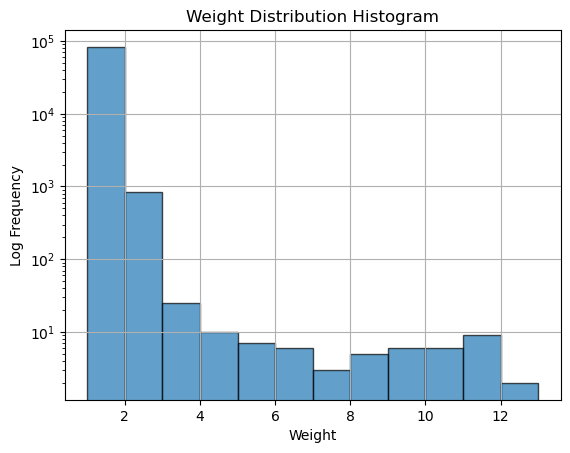

In [34]:
weights = []

csv_file_path = 'data/adjency_list.csv'

with open(csv_file_path, newline='', encoding='utf-8') as file:
    csv_reader = csv.reader(file)
    next(csv_reader)  # skip header

    for row in csv_reader:
        source, target, weight = row
        
        # convert the 'weight' to an integer
        weight = int(weight)
        weights.append(weight)

# Define the bins for the histogram
# Adjust the bins as needed to group weights effectively
bins = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,13]  # Example bin sizes

# Create the histogram
plt.hist(weights, bins=bins, edgecolor='k', alpha=0.7)
plt.xlabel('Weight')
plt.ylabel('Log Frequency')
plt.title('Weight Distribution Histogram')
plt.yscale('log')  # Set the y-axis to logarithmic scale
plt.grid(True)

# Display the histogram
plt.show()


In [30]:
weight_counts = {}


csv_file_path = 'data/adjency_list.csv'


with open(csv_file_path, newline='', encoding='utf-8') as file:
    csv_reader = csv.reader(file)
    next(csv_reader)  # skip the header

    # through each row
    for row in csv_reader:
        source, target, weight = row

        # convert the 'weight' to an integer
        weight = int(weight)

        if weight in weight_counts:
            weight_counts[weight] += 1
        else:
            weight_counts[weight] = 1

for weight, count in weight_counts.items():
    print(f"Weight {weight}: {count} occurrences")


Weight 1: 82644 occurrences
Weight 2: 833 occurrences
Weight 11: 9 occurrences
Weight 10: 6 occurrences
Weight 8: 5 occurrences
Weight 3: 25 occurrences
Weight 9: 6 occurrences
Weight 6: 6 occurrences
Weight 5: 7 occurrences
Weight 15: 2 occurrences
Weight 7: 3 occurrences
Weight 4: 10 occurrences
Weight 13: 1 occurrences
Weight 12: 1 occurrences


In [5]:
#3.7 create a adjency_list_large.csv
with open(data_large, newline='', encoding='utf-8') as file:
    tsv_small = csv.reader(file, delimiter='\t')

    adjency_list = {}
    for row in tsv_small:
        timestamp, username, tweet = row

        # split the text into words  to analyze
        words = tweet.split()

        user_mentions = {}

        for word in words:
            if word.startswith('@'):
                tag = ''.join(e for e in word if (e.isalnum() or e == '@'))

                if word != username:
                    user_mentions[tag] = user_mentions.get(tag, 0) + 1

        adjency_list[username] = user_mentions

with open('data/adjency_list_large.csv', 'w', newline='', encoding='utf-8') as csv_file:
    csv_writer = csv.writer(csv_file)
    csv_writer.writerow(["Source", "Target", "Weight"])
    
    for user, mentions in adjency_list.items():
        for mention, count in mentions.items():
            csv_writer.writerow([user, mention, count])


In [9]:
# grap init
G_large = nx.DiGraph()

df = pd.read_csv('data/adjency_list_large.csv')

for index, row in df.iterrows():
    source = row['Source']
    target = row['Target']
    weight = row['Weight']
    G_large.add_edge(source, target)
    # handle the third argument (weight)
    G_large[source][target]['weight'] = weight


# calculate number of nodes and edges

number_edges = G_large.number_of_edges()
number_nodes = G_large.number_of_nodes()

print("Number of edges: " + str(number_edges))
print("Number of nodes: " + str(number_nodes))

Number of edges: 456112
Number of nodes: 398771


In [10]:
# size and number of SCC, WCC
SCC_list = list(nx.strongly_connected_components(G_large))
number_SCC = len(SCC_list)
SCC_size_list = [len(SCC) for SCC in SCC_list]

WCC_list = list(nx.weakly_connected_components(G_large))
number_WCC = len(WCC_list)
WCC_size_list = [len(WCC) for WCC in WCC_list]


print("Strongly Connected Components (SCCs):")
print(f"Number of SCCs: {number_SCC}")
print(f"Sizes of SCCs: {SCC_size_list}")

print("\nWeakly Connected Components (WCCs):")
print(f"Number of WCCs: {number_WCC}")
print(f"Sizes of WCCs: {WCC_size_list}")

Strongly Connected Components (SCCs):
Number of SCCs: 398771
Sizes of SCCs: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [11]:
# density
density = number_edges / (number_nodes * (number_nodes - 1))
print("Density of the network: {:.8f}".format(density))

Density of the network: 0.00000287


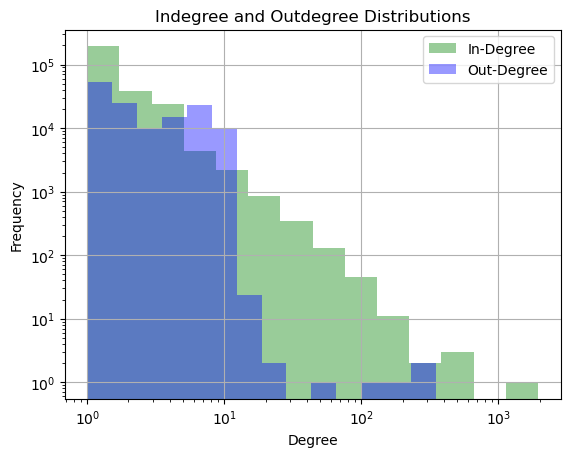

In [13]:
# indegree and outdegree
in_degree_small = dict(G_large.in_degree())
out_degree_small = dict(G_large.out_degree())

# bins=np.logspace used to create bins to solve issue of disporortional frequence and degrees.
plt.hist(list(in_degree_small.values()), bins=np.logspace(0, np.log10(max(in_degree_small.values())), 15), alpha=0.4, color='green', label='In-Degree')
plt.hist(list(out_degree_small.values()), bins=np.logspace(0, np.log10(max(out_degree_small.values())), 15), alpha=0.4, color='blue', label='Out-Degree')

# apply logarithmic scaling to the x-axis and y-axis
plt.xscale('log')  
plt.yscale('log')

plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.title('Indegree and Outdegree Distributions')
plt.grid(True)
plt.show()

In [17]:
# average clustering coefficient

average_clustering_large = nx.average_clustering(G_large)

print(f"Average Node Clustering Coefficient: {average_clustering_large:.10}")

Average Node Clustering Coefficient: 0.0


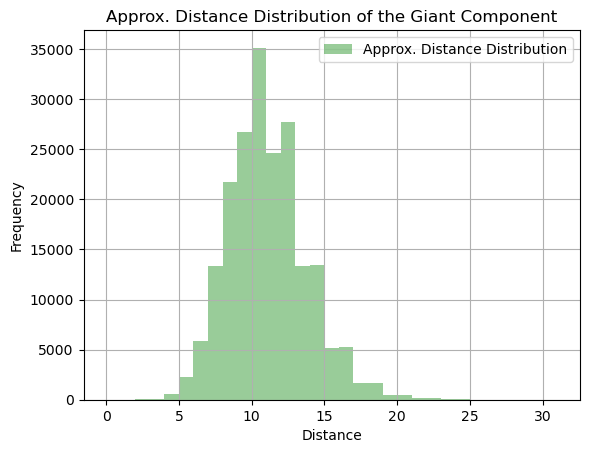

In [35]:
# (undirected) (approximated) distance distribution of the giant component
G = nx.Graph()


csv_file_path = 'data/adjency_list_large.csv'


with open(csv_file_path, 'r', newline='', encoding='utf-8') as file:
    csv_reader = csv.reader(file)
    next(csv_reader)  # skip the header

    for row in csv_reader:
        source, target, weight = row
        G.add_edge(source, target, weight=int(weight))

# find giang component
giant_component = max(nx.connected_components(G), key=len)
subgraph = G.subgraph(giant_component)

# sample diistances for pairs of nodes
def sample_distances(graph, num_samples):
    distances = []
    nodes_list = list(graph.nodes())  
    for _ in range(num_samples):
        u, v = random.sample(nodes_list, 2)
        try:
            distance = nx.shortest_path_length(graph, source=u, target=v)
            distances.append(distance)
        except nx.NetworkXNoPath:
            pass
    return distances

# sample
num_samples = 200000  
distances = sample_distances(subgraph, num_samples)

plt.hist(distances, bins=range(max(distances) + 2), alpha=0.4, color='green', label='Approx. Distance Distribution')

plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.title('Approx. Distance Distribution of the Giant Component')
plt.grid(True)
plt.show()


In [36]:
#(undirected) (approximated) average distance in the giant component
G = nx.Graph()

csv_file_path = 'data/adjency_list_large.csv'


with open(csv_file_path, 'r', newline='', encoding='utf-8') as file:
    csv_reader = csv.reader(file)
    next(csv_reader)  # skip the header

    for row in csv_reader:
        source, target, weight = row
        G.add_edge(source, target, weight=int(weight))

# find giant component
giant_component = max(nx.connected_components(G), key=len)
subgraph = G.subgraph(giant_component)

# sample diistances for pairs of nodess
def sample_distances(graph, num_samples):
    distances = []
    nodes_list = list(graph.nodes())  
    for _ in range(num_samples):
        u, v = random.sample(nodes_list, 2)
        try:
            distance = nx.shortest_path_length(graph, source=u, target=v)
            distances.append(distance)
        except nx.NetworkXNoPath:
            pass
    return distances

# sample
num_samples = 200000
distances = sample_distances(subgraph, num_samples)

# average
if distances:
    average_distance = sum(distances) / len(distances)
    print(f"(undirected) (approximated) average distance in the giant component: {average_distance:.4f}")
else:
    print("Error bro")

(undirected) (approximated) average distance in the giant component: 10.5927
